In [5]:
from sklearn.cluster import DBSCAN
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
import numpy as np
import pandas as pd

In [6]:
df = pd.read_csv("./Q1_data.csv")
df.head()

,Unnamed: 0,symbol,name,time_stamp,time_high,time_low,open,close,high,low,market_cap,volume
0,0,BTC,Bitcoin,2023-05-17T23:59:59.999Z,2023-05-17T20:09:00.000Z,2023-05-17T14:03:00.000Z,27035.470130,27398.802028,27465.927904,26600.144844,5.308901e+11,1.514001e+10
1,1,BTC,Bitcoin,2023-05-13T23:59:59.999Z,2023-05-13T18:50:00.000Z,2023-05-13T00:32:00.000Z,26807.769044,26784.078561,27030.482960,26710.873803,5.188737e+11,9.999172e+09
2,2,BTC,Bitcoin,2023-03-08T23:59:59.999Z,2023-03-08T00:23:00.000Z,2023-03-08T23:43:00.000Z,22216.442321,21718.079830,22268.896252,21708.050506,4.194214e+11,2.253658e+10
3,3,BTC,Bitcoin,2023-02-21T23:59:59.999Z,2023-02-21T08:30:00.000Z,2023-02-21T22:06:00.000Z,24833.048914,24436.354485,25126.851686,24200.364116,4.715777e+11,3.125210e+10
4,4,BTC,Bitcoin,2022-10-15T23:59:59.999Z,2022-10-15T03:59:00.000Z,2022-10-15T23:04:00.000Z,19185.437304,19067.635082,19212.541608,19019.250125,3.657224e+11,1.619224e+10


In [7]:
columns = df.columns
columns = columns.drop('market_cap')
columns = columns.drop('volume')
columns

Index(['Unnamed: 0', 'symbol', 'name', 'time_stamp', 'time_high', 'time_low',
       'open', 'close', 'high', 'low'],
      dtype='object')

In [8]:
df = df.drop(columns,axis= 1)
df.head()

,market_cap,volume
0,5.308901e+11,1.514001e+10
1,5.188737e+11,9.999172e+09
2,4.194214e+11,2.253658e+10
3,4.715777e+11,3.125210e+10
4,3.657224e+11,1.619224e+10


# for determine the optimum value for DBSCAN model would be traind with the diffrent values

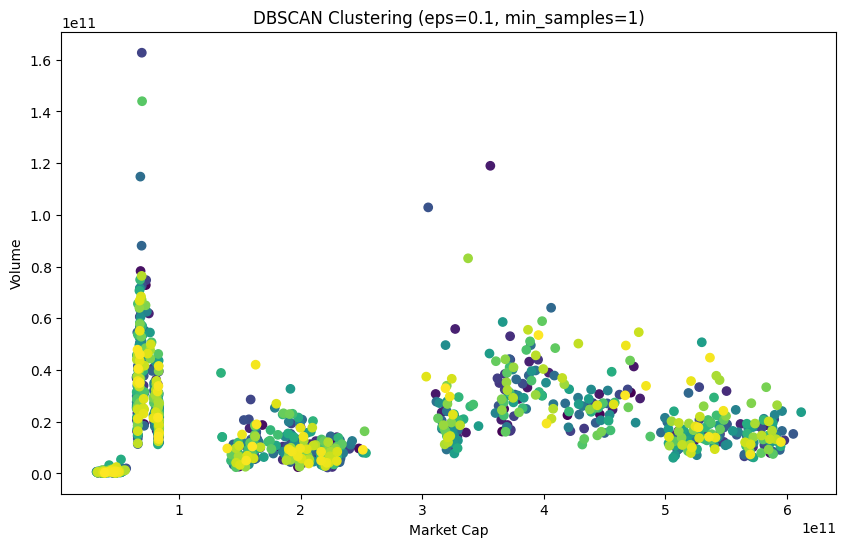

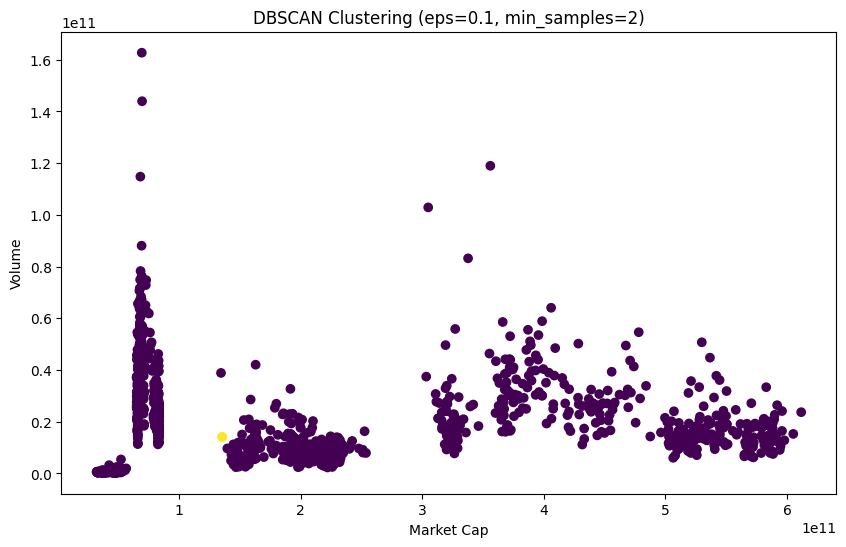

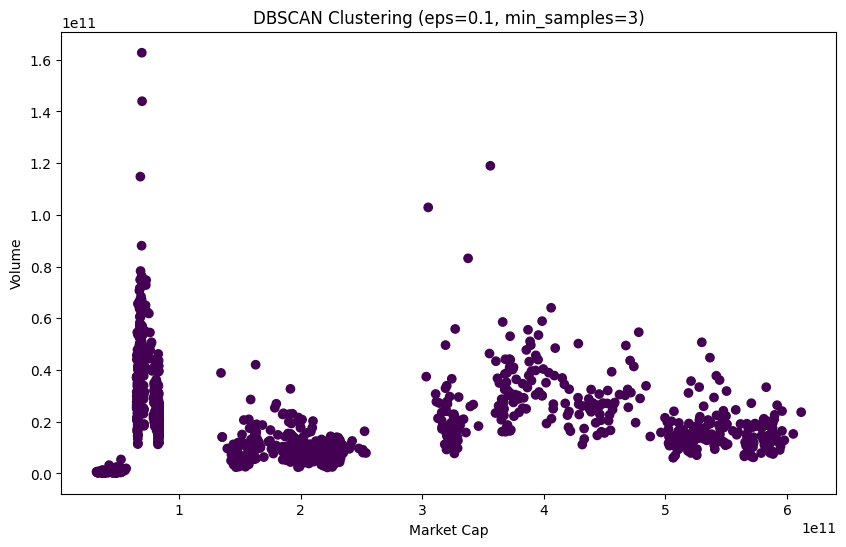

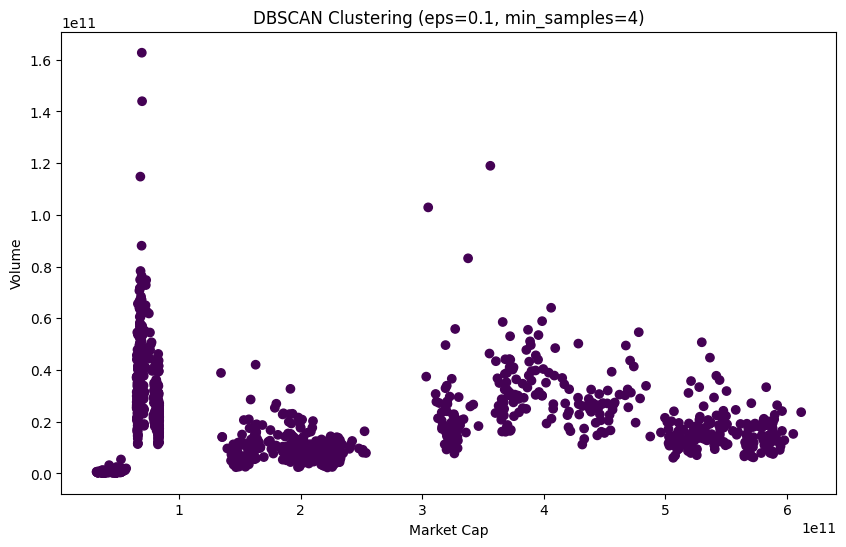

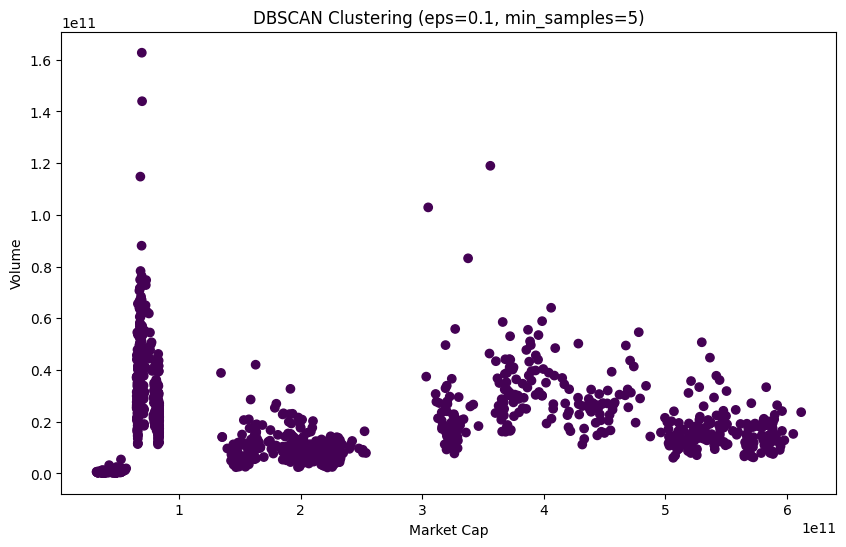

...

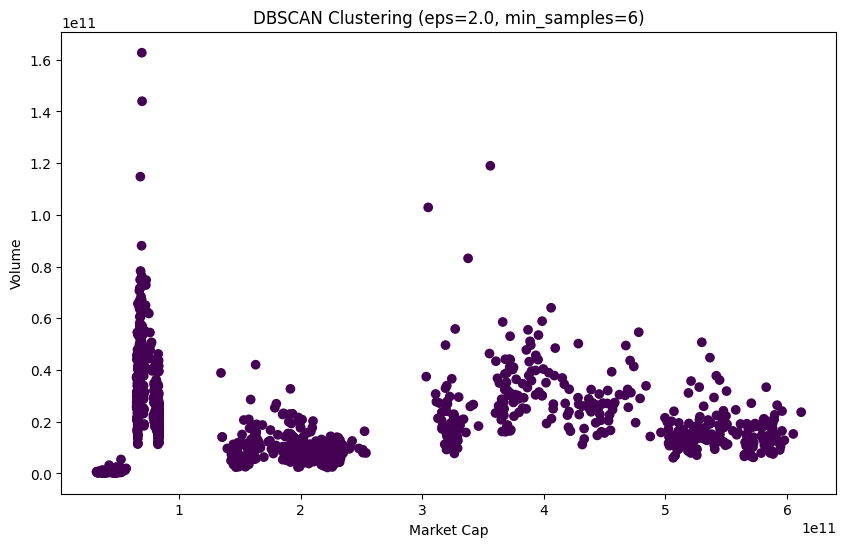

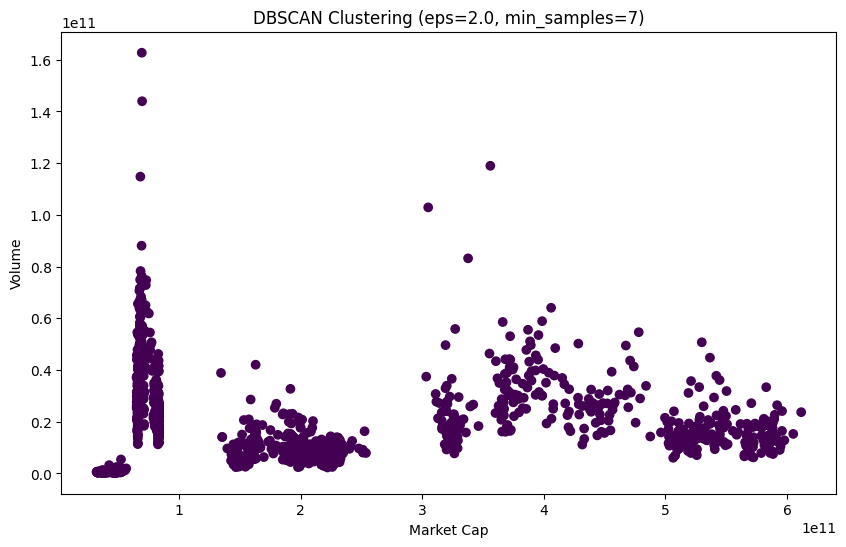

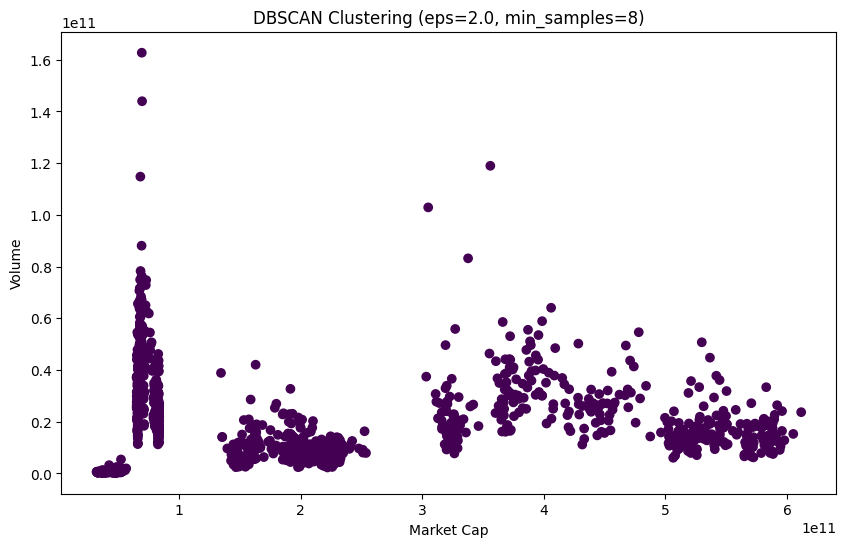

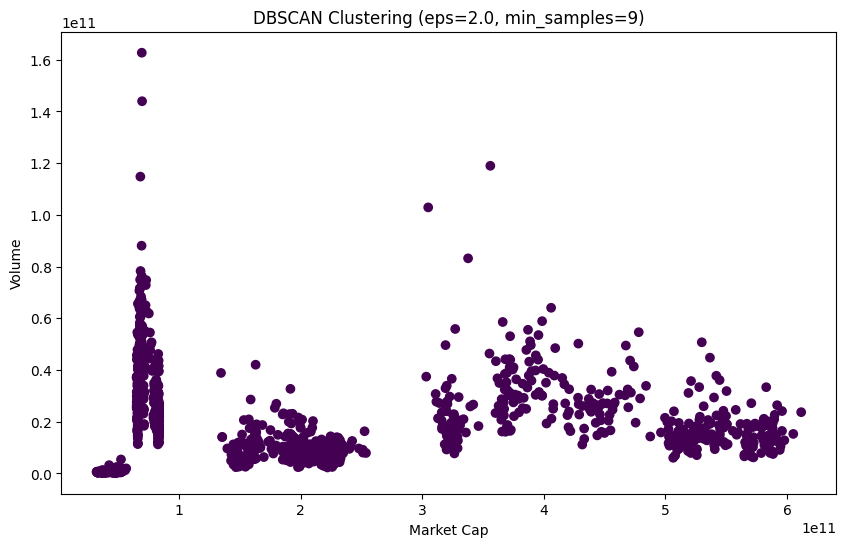

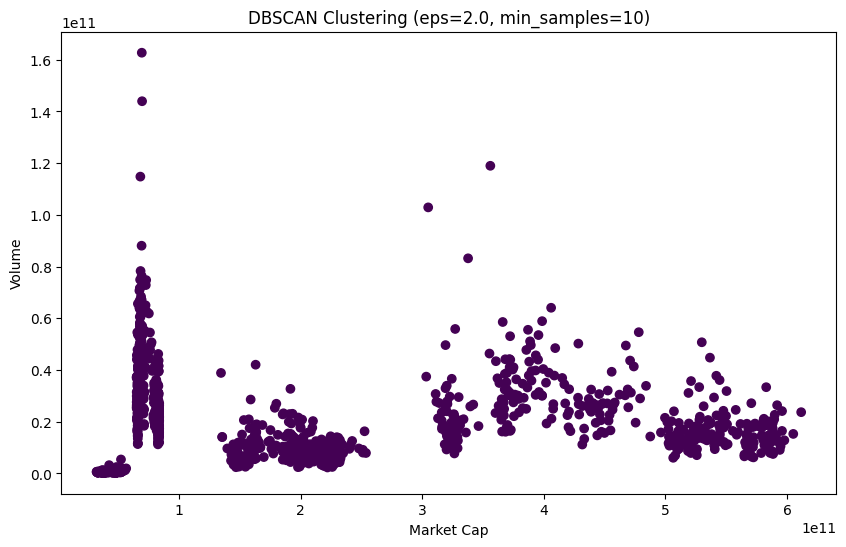

Best hyperparameters: eps=0.1, min_samples=1


In [9]:
eps_values = np.linspace(0.1, 2.0, 20)
min_samples_values = range(1, 11)


# Initialize variables to store the best hyperparameters and the corresponding silhouette score
best_eps = None
best_min_samples = None
best_silhouette_score = -1

for eps in eps_values:
    for min_samples in min_samples_values:
        dbscan = DBSCAN(eps=eps, min_samples=min_samples)
        df['cluster'] = dbscan.fit_predict(df[['market_cap', 'volume']])

        # Check for the number of unique clusters (excluding noise)
        num_clusters = len(df['cluster'].unique()) - 1

        # Calculate silhouette score
        if num_clusters > 1:
            from sklearn.metrics import silhouette_score
            silhouette_avg = silhouette_score(df[['market_cap', 'volume']], df['cluster'])
        else:
            silhouette_avg = -1  # Not enough clusters

        # Plot the clusters for this combination of hyperparameters
        plt.figure(figsize=(10, 6))
        plt.scatter(df['market_cap'], df['volume'], c=df['cluster'], cmap='viridis')
        plt.title(f'DBSCAN Clustering (eps={eps}, min_samples={min_samples})')
        plt.xlabel('Market Cap')
        plt.ylabel('Volume')
        plt.show()

        if silhouette_avg > best_silhouette_score:
            best_eps = eps
            best_min_samples = min_samples
            best_silhouette_score = silhouette_avg

print(f'Best hyperparameters: eps={best_eps}, min_samples={best_min_samples}')

# base on the obesrvation that has been show in above Cell the desired value for example  EPS = 0.2 and min_simple = 8

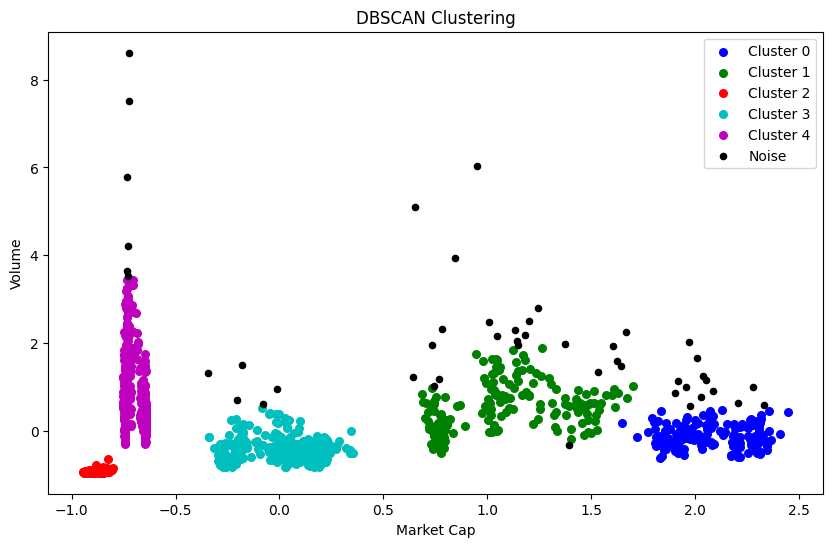

In [10]:
# Standardize your data (mean=0, std=1)
scaler = StandardScaler()
df[['market_cap', 'volume']] = scaler.fit_transform(df[['market_cap', 'volume']])
# Create a DBSCAN model
dbscan = DBSCAN(eps=0.2, min_samples=8)  # Adjust the parameters as needed

# Fit the model to your data
df['cluster'] = dbscan.fit_predict(df[['market_cap', 'volume']])
# Plot the clusters
plt.figure(figsize=(10, 6))
colors = ['b', 'g', 'r', 'c', 'm', 'y', 'k']

for cluster_id in df['cluster'].unique():
    if cluster_id == -1:
        # Noise points
        noise_points = df[df['cluster'] == -1]
        plt.scatter(noise_points['market_cap'], noise_points['volume'], color='k', s=20, label='Noise')
    else:
        cluster_points = df[df['cluster'] == cluster_id]
        plt.scatter(cluster_points['market_cap'], cluster_points['volume'], color=colors[cluster_id % len(colors)], s=30, label=f'Cluster {cluster_id}')

plt.title('DBSCAN Clustering')
plt.xlabel('Market Cap')
plt.ylabel('Volume')
plt.legend()
plt.show()



# the result of Clusting base on the EPS and MIN_sample would equal to

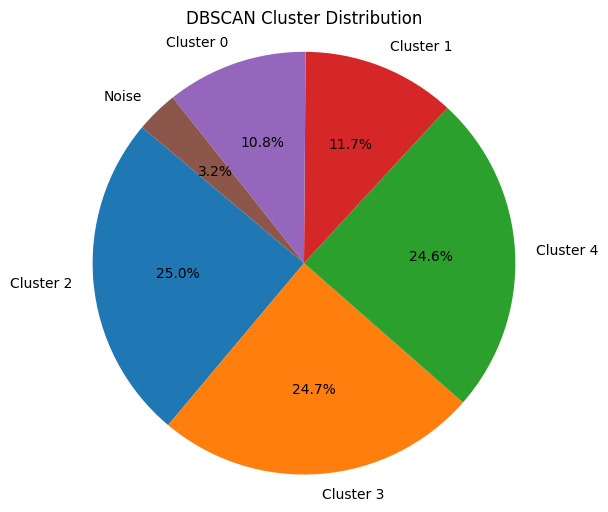

In [11]:

# Create a DBSCAN model
dbscan = DBSCAN(eps=0.2, min_samples=8)

# Fit the model to your data
df['cluster'] = dbscan.fit_predict(df[['market_cap', 'volume']])

# Count the number of samples in each cluster (including noise)
cluster_counts = df['cluster'].value_counts()

# Create labels and sizes, including noise (-1)
labels = [f'Cluster {cluster_id}' if cluster_id != -1 else 'Noise' for cluster_id in cluster_counts.index]
sizes = cluster_counts.values

# Create a pie plot
plt.figure(figsize=(6, 6))
plt.pie(sizes, labels=labels, autopct='%1.1f%%', startangle=140)
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
plt.title('DBSCAN Cluster Distribution')
plt.show()


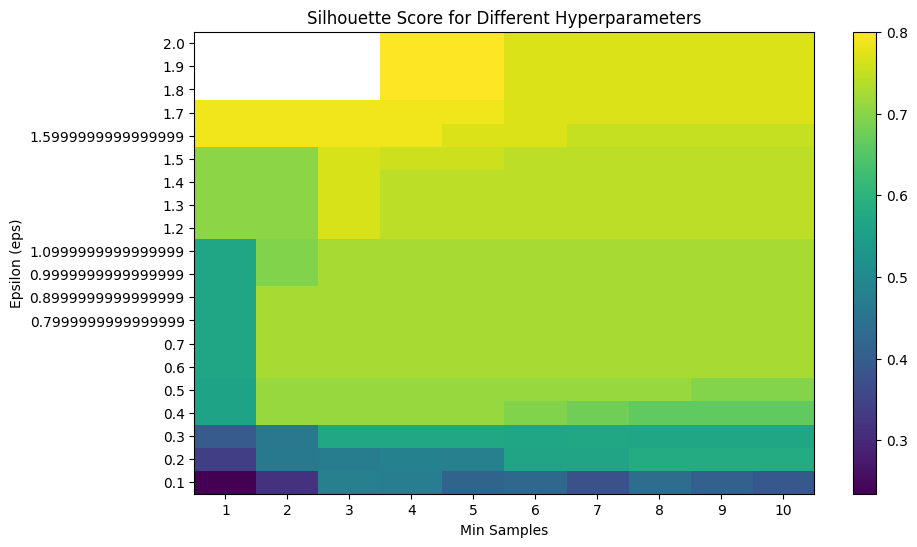

Best hyperparameters: eps= 1.8 min_samples= 4
Best Silhouette Score: 0.8001381980227339


In [10]:
# Define a range of hyperparameter values to search
eps_values = np.linspace(0.1, 2.0, 20)
min_samples_values = range(1, 11)

# Initialize variables to store the best hyperparameters and Silhouette Score
best_eps = None
best_min_samples = None
best_silhouette_score = -1

# Lists to store the results
silhouette_scores = []

for eps in eps_values:
    for min_samples in min_samples_values:
        dbscan = DBSCAN(eps=eps, min_samples=min_samples)
        df['cluster'] = dbscan.fit_predict(df[['market_cap', 'volume']])
        
        # Count the number of unique clusters (excluding noise)
        num_clusters = len(set(df['cluster'])) - (1 if -1 in df['cluster'] else 0)
        
        # Calculate Silhouette Score if more than one cluster is present
        if num_clusters > 1:
            silhouette_avg = silhouette_score(df[['market_cap', 'volume']], df['cluster'])
            silhouette_scores.append(silhouette_avg)
            
            # Check if the current combination is the best
            if silhouette_avg > best_silhouette_score:
                best_eps = eps
                best_min_samples = min_samples
                best_silhouette_score = silhouette_avg
        else:
            silhouette_scores.append(-1)  # Use a placeholder value

# Replace -1 with NaN for plotting
silhouette_scores = np.array(silhouette_scores).reshape(len(eps_values), len(min_samples_values))
silhouette_scores[silhouette_scores == -1] = np.nan

plt.figure(figsize=(10, 6))
plt.imshow(silhouette_scores, cmap='viridis', origin='lower', aspect='auto')
plt.colorbar()
plt.xticks(np.arange(len(min_samples_values)), min_samples_values)
plt.yticks(np.arange(len(eps_values)), eps_values)
plt.xlabel('Min Samples')
plt.ylabel('Epsilon (eps)')
plt.title('Silhouette Score for Different Hyperparameters')
plt.show()

if best_eps is not None and best_min_samples is not None:
    print('Best hyperparameters: eps=', best_eps, 'min_samples=', best_min_samples)
    print('Best Silhouette Score:', best_silhouette_score)
else:
    print('Meaningful clustering was not achieved with the given hyperparameters.')


Estimated number of clusters: 5
Estimated number of noise points: 47


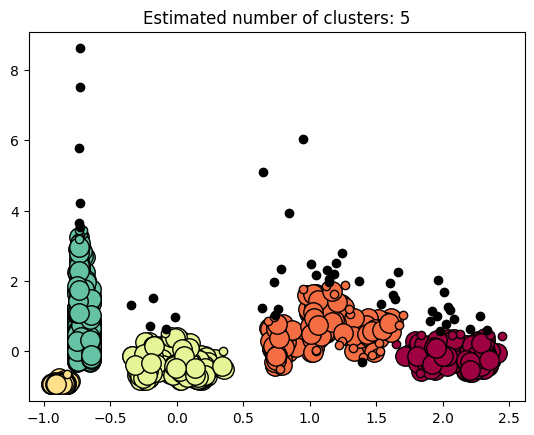

In [6]:
# Compute DBSCAN with your parameters
db = DBSCAN(eps=0.2, min_samples=8).fit(df[['market_cap', 'volume']])

core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
core_samples_mask[db.core_sample_indices_] = True
labels = db.labels_

# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
n_noise_ = list(labels).count(-1)

print('Estimated number of clusters: %d' % n_clusters_)
print('Estimated number of noise points: %d' % n_noise_)

# Plot result
%matplotlib inline

# Black removed and is used for noise instead.
unique_labels = set(labels)
colors = [plt.cm.Spectral(each) for each in np.linspace(0, 1, len(unique_labels))]
for k, col in zip(unique_labels, colors):
    if k == -1:
        # Black used for noise.
        col = [0, 0, 0, 1]

    class_member_mask = (labels == k)

    xy = df[['market_cap', 'volume']][class_member_mask & core_samples_mask]
    plt.plot(xy['market_cap'], xy['volume'], 'o', markerfacecolor=tuple(col), markeredgecolor='k', markersize=14)

    xy = df[['market_cap', 'volume']][class_member_mask & ~core_samples_mask]
    plt.plot(xy['market_cap'], xy['volume'], 'o', markerfacecolor=tuple(col), markeredgecolor='k', markersize=6)

plt.title('Estimated number of clusters: %d' % n_clusters_)
plt.show()
